# Extract Address information and Convert to geographical coordinate

In [1]:
#!pip install geopy
!pip install folium

In [2]:
import pandas as pd

## Read the data

`BuzzardsBayNEP_grants_2000-2023` and `CZM_Grants` dataset included geo info in the original dataset.

In [38]:
# df_comm_refrige = pd.read_csv('data/commerical_refrige.csv') 
df_cgc =  pd.read_csv('data/competitive_green_community_grant.csv')
df_smrp = pd.read_csv('data/Sustainable_materials_recovery_program_grant.csv',encoding='latin1')
df_smrp_town = pd.read_csv('data/Sustainable_materials_recovery_program_grant_town_name_only.csv')


## Sustainable Materials Recovery Program Grant

### Town name only

The subset of data contain grants that are listed without detail location, so we will use the centroid of town/ awardee/
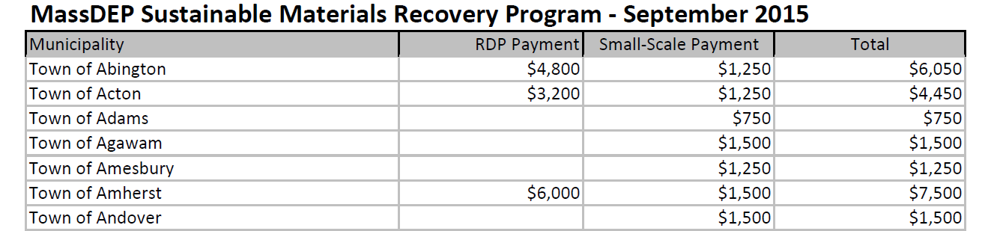

In [ ]:
import requests
import pandas as pd
import time

api_key = 'enter you api key here'

# Function to get coordinates using Google Geocoding API
def get_google_coordinates(town, api_key):
    url = f"https://maps.googleapis.com/maps/api/geocode/json?address={town},MA&key={api_key}"
    response = requests.get(url)
    if response.status_code == 200:
        result = response.json().get('results')
        if result:
            location = result[0]['geometry']['location']
            return location['lat'], location['lng']
        else:
            return (None, None)
    else:
        print(f"Error for {town}: {response.status_code}")
        return (None, None)

# Add latitude and longitude columns with a delay to respect rate limits
coordinates = []
total_towns = len(df_smrp_town)
for index, town in enumerate(df_smrp_town['Municipality']):
    lat_lng = get_google_coordinates(town, api_key)
    coordinates.append(lat_lng)
    # Print the progress
    print(f"Processing {town}: {index+1}/{total_towns} completed. ({((index+1)/total_towns)*100:.2f}% done)")
    time.sleep(0.1)  # Adjust delay to respect Google API limits

# Add the coordinates to the DataFrame
df_smrp_town['Coordinates'] = coordinates
df_smrp[['Latitude', 'Longitude']] = pd.DataFrame(df_smrp_town['Coordinates'].tolist(), index=df_smrp_town.index)

# Save the result to a new CSV file
df_smrp_town.to_csv('SMRP_town_geo.csv', index=False)

print("Geocoding completed and saved to 'SMRP_town_geo.csv'")


#### Map Verification

In [13]:
import folium
import pandas as pd
from IPython.display import display

# Load the CSV file (if not already loaded in your environment)
df_smrp_town = pd.read_csv('SMRP_town_geo.csv')

# Create a map centered around a general location in Massachusetts
map_center = [42.4072, -71.3824]  # Coordinates of Massachusetts
m = folium.Map(location=map_center, zoom_start=8)

# Add markers for each town
for idx, row in df_smrp_town.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    town_name = row['Municipality']

    # Only add markers for valid coordinates
    if pd.notnull(lat) and pd.notnull(lon):
        folium.Marker([lat, lon], popup=town_name).add_to(m)

# Display the map directly
display(m)


In [ ]:
# Create a map centered around Massachusetts
m = folium.Map(location=[42.4072, -71.3824], zoom_start=7)

# Add each geocoded location to the map
for _, row in coordinates_df.iterrows():
    if row['Latitude'] and row['Longitude']:
        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            popup=row['Location']
        ).add_to(m)

# Save the map to an HTML file or display it
m.save('massachusetts_locations_map.html')

### MSRP

#### NLP

Extract Location from Grant Description and Combine with Grantee to form detailed address.

In [40]:
import spacy
import pandas as pd
from geopy.geocoders import Nominatim
import time

# Load spacy's English model
!python -m spacy download en_core_web_lg
#!python -m spacy download en_core_web_trf
nlp = spacy.load("en_core_web_lg")

# Function to extract location-related entities
def extract_locations(text):
    doc = nlp(text)
    locations = []
    for ent in doc.ents:
        if ent.label_ in ['GPE', 'LOC', 'FAC', 'ORG']:  # GPE: Geo-Political Entity, LOC: Locations, FAC: Facilities, ORG: Organizations
            locations.append(ent.text)
    return locations

#df_new_smrp = df_smrp
# Apply the function to the 'Grant Description' column
#df_new_smrp['Locations'] = df_new_smrp['Grant Description'].apply(extract_locations)

     ---------------------------------------- 0.0/587.7 MB ? eta -:--:--
     ---------------------------------------- 0.1/587.7 MB 2.8 MB/s eta 0:03:28
     ---------------------------------------- 0.8/587.7 MB 8.7 MB/s eta 0:01:08
     --------------------------------------- 2.3/587.7 MB 18.4 MB/s eta 0:00:32
     --------------------------------------- 5.0/587.7 MB 26.4 MB/s eta 0:00:23
     --------------------------------------- 7.5/587.7 MB 31.7 MB/s eta 0:00:19
      ------------------------------------- 10.1/587.7 MB 35.8 MB/s eta 0:00:17
      ------------------------------------- 13.2/587.7 MB 65.6 MB/s eta 0:00:09
     - ------------------------------------ 15.7/587.7 MB 65.2 MB/s eta 0:00:09
     - ------------------------------------ 18.6/587.7 MB 65.2 MB/s eta 0:00:09
     - ------------------------------------ 20.8/587.7 MB 59.8 MB/s eta 0:00:10
     - ------------------------------------ 23.9/587.7 MB 65.6 MB/s eta 0:00:09
     - ------------------------------------ 27.

In [ ]:
df_news_smrp = df_new_smrp[df_new_smrp['Locations'].apply(len) > 0]
df_news_smrp # see how many of them

However, upon inspection, the Grant Description only contains vague description that is unable to  track address, such as *Mattress Collection Container*, *School Recycle* and etc. So we will use grantee only for coordinate. Additionally, for `Devens Enterprise Commission` where the projected is conducted at multiple towns (**(AYER, BOLTON, DEVENS, GROTON, HARVARD, LANCASTER, LITTLETON, LUNENBURG, TOWNSEND)**), we will follow the format used in the `CZM Grant` and use the location of grantee instead.

#### Coordinate

In [40]:
import requests
import pandas as pd
import time

api_key = 'enter you api key here'

# Function to get coordinates using Google Geocoding API
def get_google_coordinates(town, api_key):
    url = f"https://maps.googleapis.com/maps/api/geocode/json?address={town},MA&key={api_key}"
    response = requests.get(url)
    if response.status_code == 200:
        result = response.json().get('results')
        if result:
            location = result[0]['geometry']['location']
            return location['lat'], location['lng']
        else:
            return (None, None)
    else:
        print(f"Error for {town}: {response.status_code}")
        return (None, None)

# Add latitude and longitude columns with a delay to respect rate limits
coordinates = []
total_towns = len(df_smrp)
for index, town in enumerate(df_smrp['Grantee']):
    lat_lng = get_google_coordinates(town, api_key)
    coordinates.append(lat_lng)
    # Print the progress
    print(f"Processing {town}: {index+1}/{total_towns} completed. ({((index+1)/total_towns)*100:.2f}% done)")
    time.sleep(0.1)  # Adjust delay to respect Google API limits

# Add the coordinates to the DataFrame
df_smrp['Coordinates'] = coordinates
df_smrp[['Latitude', 'Longitude']] = pd.DataFrame(df_smrp['Coordinates'].tolist(), index=df_smrp.index)

# Save the result to a new CSV file
df_smrp.to_csv('SMRP_geo.csv', index=False)

print("Geocoding completed and saved to 'SMRP_geo.csv'")


Processing Town of Agawam : 1/1631 completed. (0.06% done)
Processing Town of Andover : 2/1631 completed. (0.12% done)
Processing Town of Arlington : 3/1631 completed. (0.18% done)
Processing Town of Ashby : 4/1631 completed. (0.25% done)
Processing Town of Auburn : 5/1631 completed. (0.31% done)
Processing Town of Ayer : 6/1631 completed. (0.37% done)
Processing Town of Barnstable : 7/1631 completed. (0.43% done)
Processing Town of Bedford : 8/1631 completed. (0.49% done)
Processing Town of Bellingham : 9/1631 completed. (0.55% done)
Processing Town of Belmont : 10/1631 completed. (0.61% done)
Processing Town of Belmont : 11/1631 completed. (0.67% done)
Processing Town of Bernardston : 12/1631 completed. (0.74% done)
Processing City of Beverly : 13/1631 completed. (0.80% done)
Processing Town of Bolton : 14/1631 completed. (0.86% done)
Processing City of Boston : 15/1631 completed. (0.92% done)
Processing Town of Buckland : 16/1631 completed. (0.98% done)
Processing Town of Carlisle :

#### Map Verification

In [44]:
import folium
import pandas as pd
from IPython.display import display

# Create a map centered around a general location in Massachusetts
map_center = [42.4072, -71.3824]  # Coordinates of Massachusetts
m = folium.Map(location=map_center, zoom_start=8)

# Add markers for each town
for idx, row in df_smrp.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    town_name = row['Grantee']

    # Only add markers for valid coordinates
    if pd.notnull(lat) and pd.notnull(lon):
        folium.Marker([lat, lon], popup=town_name).add_to(m)

# Display the map directly
display(m)

In [61]:
df_smrp.loc[df_smrp['Grantee'].str.contains(r'Town of Groton \(GROTON, LITTLETON, ASHBY\)'), ['Latitude', 'Longitude']] = [42.623688, -71.502313]
df_smrp.loc[df_smrp['Grantee'].str.contains(r'Town of Groton \(GROTON, LITTLETON, ASHBY\)'), ['Coordinates']] = ['42.623688, -71.502313']

Correctly the outlier in NY.

In [ ]:
df_smrp.loc[df_smrp['Grantee'].str.contains(r'Town of Groton \(GROTON, LITTLETON, ASHBY\)'), ['Latitude', 'Longitude']] = [42.623688, -71.502313]
df_smrp.loc[df_smrp['Grantee'].str.contains(r'Town of Groton \(GROTON, LITTLETON, ASHBY\)'), ['Coordinates']] = ['42.623688, -71.502313']

In [64]:
df_smrp.loc[df_smrp['Grantee'].str.contains(r'Town of Groton \(GROTON, LITTLETON, ASHBY\)')]
df_smrp.to_csv('SMRP_geo.csv', index=False)

In [63]:
import folium
import pandas as pd
from IPython.display import display

# Create a map centered around a general location in Massachusetts
map_center = [42.4072, -71.3824]  # Coordinates of Massachusetts
m = folium.Map(location=map_center, zoom_start=8)

# Add markers for each town
for idx, row in df_smrp.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    town_name = row['Grantee']

    # Only add markers for valid coordinates
    if pd.notnull(lat) and pd.notnull(lon):
        folium.Marker([lat, lon], popup=town_name).add_to(m)

# Display the map directly
display(m)

## Competitive Green Community Grant

In [50]:
df_cgc = pd.read_csv('data/competitive_green_community_grant.csv')
df_cgc.head()

,municipality,grant_award,region,description_of_projects_funded,year
0,Adams,"$161,373",West,"to fund energy conservation measures, LED ligh...",2021
1,Ashburnham,"$20,000",Central,"to fund energy conservation measures, hybrid p...",2021
2,Ashby,"$10,413",Central,"to fund energy conservation measures, programm...",2021
3,Athol,"$111,514",West,"to fund energy conservation measures, LED ligh...",2021
4,Attleboro,"$186,629",South,"to fund energy conservation measures, weatheri...",2021


In [51]:
df_cgc['Locations'] = df_cgc['description_of_projects_funded'].apply(extract_locations)
df_cgc.head()

,municipality,grant_award,region,description_of_projects_funded,year,Locations
0,Adams,"$161,373",West,"to fund energy conservation measures, LED ligh...",2021,"[Dept of\rPublic Works, Town Hall]"
1,Ashburnham,"$20,000",Central,"to fund energy conservation measures, hybrid p...",2021,[]
2,Ashby,"$10,413",Central,"to fund energy conservation measures, programm...",2021,"[Fire Station, Town Hall]"
3,Athol,"$111,514",West,"to fund energy conservation measures, LED ligh...",2021,"[Town Hall, Senior Center]"
4,Attleboro,"$186,629",South,"to fund energy conservation measures, weatheri...",2021,"[Annex Building, City Hall, South, Briggs Fire..."


In [52]:
num_non_null_locations = df_cgc['Locations'].apply(lambda x: len(x) > 0).sum()
print(f"Number of rows in df_cgc where Locations is not null: {num_non_null_locations}")

Number of rows in df_cgc where Locations is not null: 588


We will randomly sample 20 of them to ensure correct locations info are extracted

In [47]:
import random

# Filter the DataFrame to get rows where Locations is not null
df_non_null_locations = df_cgc[df_cgc['Locations'].apply(lambda x: len(x) > 0)]

# Randomly select 20 samples
sampled_df = df_non_null_locations.sample(n=20, random_state=1)

# Output their description and location
for idx, row in sampled_df.iterrows():
    print(f"Town: {row['municipality']}")
    print(f"Description: {row['description_of_projects_funded']}")
    print(f"Location: {row['Locations']}")
    print()

Town: Agawam
Description: to fund energy conservation measures, air handling unit filters and controls, DDC controls, lighting, and refrigeration upgrades, in municipal facilities including Granger Elementary School, Library, and DPW
Location: ['DDC', 'Granger Elementary School, Library', 'DPW']

Town: Plympton
Description: to fund energy conservation measures, transformers, weatherization, boilers, mechanical insulation, LED lighting, thermostats, appliances, and administrative and technical support, in municipal facilities including Dennett Elementary School, Highway Dept., and Historical Society
Location: ['Dennett Elementary School', 'Highway Dept', 'Historical Society']

Town: Marlborough
facilities including ECLC Freeman School measures, energy management system controller upgrade and pneumatic to DDC conversion, in municipal
Location: ['DDC']

Town: New Bedford
Description: to fund energy conservation measures, lighting, in municipal facilities including Wastewater Treatment Pla

In [48]:
# df_cgc['Locations'] = df_cgc.apply(lambda row: row['municipality'] if not row['Locations'] else row['Locations'], axis=1)
# df_cgc.head()

,municipality,grant_award,region,description_of_projects_funded,year,Locations
0,Adams,"$161,373",West,"to fund energy conservation measures, LED ligh...",2021,"[Dept of\rPublic Works, Town Hall]"
1,Ashburnham,"$20,000",Central,"to fund energy conservation measures, hybrid p...",2021,Ashburnham
2,Ashby,"$10,413",Central,"to fund energy conservation measures, programm...",2021,"[Fire Station, Town Hall]"
3,Athol,"$111,514",West,"to fund energy conservation measures, LED ligh...",2021,"[Town Hall, Senior Center]"
4,Attleboro,"$186,629",South,"to fund energy conservation measures, weatheri...",2021,"[Annex Building, City Hall, South, Briggs Fire..."


Check where they are multiple buildings in one locations
Because we are uncertain of the grant award usage among them, we will use the centroid of those location.

In [56]:
# Function to get coordinates using Google Geocoding API
def get_google_coordinates(address, api_key):
    url = f"https://maps.googleapis.com/maps/api/geocode/json?address={address}&key={api_key}"
    response = requests.get(url)
    if response.status_code == 200:
        result = response.json().get('results')
        if result:
            location = result[0]['geometry']['location']
            return location['lat'], location['lng']
        else:
            return (None, None)
    else:
        print(f"Error for {address}: {response.status_code}")
        return (None, None)

# Function to calculate centroid from multiple coordinates
def calculate_centroid(coordinates):
    if coordinates:
        latitudes = [coord[0] for coord in coordinates if coord[0] is not None]
        longitudes = [coord[1] for coord in coordinates if coord[1] is not None]
        if latitudes and longitudes:
            return mean(latitudes), mean(longitudes)
    return (None, None)

# Add latitude and longitude columns with a delay to respect rate limits
coordinates = []
total_towns = len(df_cgc)

for index, row in df_cgc.iterrows():
    municipality = row['municipality']
    location = row['Locations']
    
    if isinstance(location, str) and pd.notna(location):
        # Handle multiple locations separated by commas
        locations_list = [loc.strip() for loc in location.split(',')]
        coords_list = []
        
        # Get coordinates for each location
        for loc in locations_list:
            address = f"{loc}, {municipality}, MA"
            lat_lng = get_google_coordinates(address, api_key)
            coords_list.append(lat_lng)
        
        # Calculate centroid if multiple locations, else use single result
        if len(coords_list) > 1:
            centroid = calculate_centroid(coords_list)
            coordinates.append(centroid)
        else:
            coordinates.append(coords_list[0])
    
    else:
        # If location is null or not a string, just use Municipality + MA
        address = f"{municipality}, MA"
        lat_lng = get_google_coordinates(address, api_key)
        coordinates.append(lat_lng)
    
    # Print the progress
    print(f"Processing {municipality}: {index+1}/{total_towns} completed. ({((index+1)/total_towns)*100:.2f}% done)")
    time.sleep(0.1)  # Adjust delay to respect Google API limits

# Add the coordinates to the DataFrame
df_cgc['Coordinates'] = coordinates
df_cgc[['Latitude', 'Longitude']] = pd.DataFrame(df_cgc['Coordinates'].tolist(), index=df_cgc.index)

# Save the result to a new CSV file
df_cgc.to_csv('CGC_town_geo.csv', index=False)

print("Geocoding completed and saved to 'CGC_town_geo.csv'")


Processing Adams: 1/647 completed. (0.15% done)
Processing Ashburnham: 2/647 completed. (0.31% done)
Processing Ashby: 3/647 completed. (0.46% done)
Processing Athol: 4/647 completed. (0.62% done)
Processing Attleboro: 5/647 completed. (0.77% done)
Processing Bernardston: 6/647 completed. (0.93% done)
Processing Billerica: 7/647 completed. (1.08% done)
Processing Blackstone: 8/647 completed. (1.24% done)
Processing Brookline: 9/647 completed. (1.39% done)
Processing Buckland: 10/647 completed. (1.55% done)
Processing Chelmsford: 11/647 completed. (1.70% done)
Processing Cohasset: 12/647 completed. (1.85% done)
Processing Concord: 13/647 completed. (2.01% done)
Processing Douglas: 14/647 completed. (2.16% done)
Processing Dudley: 15/647 completed. (2.32% done)
Processing Easthampton: 16/647 completed. (2.47% done)
Processing Franklin: 17/647 completed. (2.63% done)
Processing Georgetown: 18/647 completed. (2.78% done)
Processing Gloucester: 19/647 completed. (2.94% done)
Processing Grot

In [59]:
df_cgc.head()

,Municipality,Description,Amount,Year,Coordinates,Latitude,Longitude
0,Town of Abington,RDP Payment,4800,2015.0,"(42.1048228, -70.9453218)",42.104823,-70.945322
1,Town of Acton,RDP Payment,3200,2015.0,"(42.4850931, -71.43284)",42.485093,-71.432840
2,Town of Adams,Small-Scale Payment,750,2015.0,"(42.621499, -73.121106)",42.621499,-73.121106
3,Town of Agawam,Small-Scale Payment,1500,2015.0,"(42.0695391, -72.61481169999999)",42.069539,-72.614812
4,Town of Amesbury,Small-Scale Payment,1250,2015.0,"(42.85839250000001, -70.93003759999999)",42.858393,-70.930038


### Map

In [60]:
import folium
import pandas as pd
from IPython.display import display

# Load the CSV file (if not already loaded in your environment)
df_cgc = pd.read_csv('SMRP_town_geo.csv')

# Create a map centered around a general location in Massachusetts
map_center = [42.4072, -71.3824]  # Coordinates of Massachusetts
m = folium.Map(location=map_center, zoom_start=8)

# Add markers for each town
for idx, row in df_cgc.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    town_name = row['Municipality']

    # Only add markers for valid coordinates
    if pd.notnull(lat) and pd.notnull(lon):
        folium.Marker([lat, lon], popup=town_name).add_to(m)

# Display the map directly
display(m)


In [62]:
df_cgc.to_csv('data/competitive_green_community_grant_geo.csv',encoding='utf-8', index=False)

## Reduce Reuse

In [90]:
df_rrr = pd.read_csv('data/reduce_reuse_repair_micro_grant.csv',encoding='latin1')
df_rrr.head()

,Fiscal Year,Grantee,Project Title,Location,Award Amount
0,2019,Fresh Start Furniture Bank,Bulk Furniture Loading Dock,Hudson,"$3,150.00"
1,2019,"Roots & Dreams and Mustard Seed, Inc",The BagShare Pittsfield Chapter/Roots & Dreams,Pittsfield,"$5,000.00"
2,2019,More Than Words,More Than Words Used Textile Collection,Waltham,"$5,000.00"
3,2019,"Berkshire Environmental Action Team, LLC.",Berkshire Zero-Waste Initiative,Pittsfield,"$5,000.00"
4,2019,Town of Rowe,Rowe Town Library - Library of Things,Rowe,"$2,500.00"


In [100]:
df_rrr['Grantee'] = df_rrr['Grantee'].astype(str)
df_rrr['Project Title'] = df_rrr['Project Title'].astype(str)
df_rrr[~df_rrr['Grantee'].str.contains('Town of')]

,Fiscal Year,Grantee,Project Title,Location,Award Amount,Locations
0,2019,Fresh Start Furniture Bank,Bulk Furniture Loading Dock,Hudson,"$3,150.00",[]
1,2019,"Roots & Dreams and Mustard Seed, Inc",The BagShare Pittsfield Chapter/Roots & Dreams,Pittsfield,"$5,000.00",[The BagShare Pittsfield Chapter/Roots & Dreams]
2,2019,More Than Words,More Than Words Used Textile Collection,Waltham,"$5,000.00",[]
3,2019,"Berkshire Environmental Action Team, LLC.",Berkshire Zero-Waste Initiative,Pittsfield,"$5,000.00",[]
5,2020,USEFUL(FKA Coffee Cup Collective),Coffee Cup Collective - a circular economy for...,Boston,"$5,000.00",[]
...,...,...,...,...,...,...
62,2025,Devens Eco-Efficiency Center,Building Engagement in The Great Exchange to E...,Devens,"$6,491.00","[The Great Exchange, Expand Reuse Activities]"
63,2025,Berkshire Environmental Action Team,Community Commercial Dishwasher at BEAT's Envi...,Pittsfield,"$9,440.00",[BEAT]
64,2025,University of Massachusetts Amherst - Sustaina...,New2U Reuse & Thrift Store: Expanding a succes...,Amherst,"$8,000.00",[Reuse & Thrift Store]
65,2025,"Food Rescue US, Inc.",Re-establishing the Roslindale Community Fridge,Stamford,"$10,000.00",[the Roslindale Community Fridge]


In [106]:
df_rrr['Locations'] = df_rrr['Project Title'].apply(lambda x: extract_locations(x) if isinstance(x, str) else None)
df_rrr

,Fiscal Year,Grantee,Project Title,Location,Award Amount,Locations
0,2019,Fresh Start Furniture Bank,Bulk Furniture Loading Dock,Hudson,"$3,150.00",[]
1,2019,"Roots & Dreams and Mustard Seed, Inc",The BagShare Pittsfield Chapter/Roots & Dreams,Pittsfield,"$5,000.00",[The BagShare Pittsfield Chapter/Roots & Dreams]
2,2019,More Than Words,More Than Words Used Textile Collection,Waltham,"$5,000.00",[]
3,2019,"Berkshire Environmental Action Team, LLC.",Berkshire Zero-Waste Initiative,Pittsfield,"$5,000.00",[]
4,2019,Town of Rowe,Rowe Town Library - Library of Things,Rowe,"$2,500.00",[Rowe Town Library - Library of Things]
...,...,...,...,...,...,...
62,2025,Devens Eco-Efficiency Center,Building Engagement in The Great Exchange to E...,Devens,"$6,491.00","[The Great Exchange, Expand Reuse Activities]"
63,2025,Berkshire Environmental Action Team,Community Commercial Dishwasher at BEAT's Envi...,Pittsfield,"$9,440.00",[BEAT]
64,2025,University of Massachusetts Amherst - Sustaina...,New2U Reuse & Thrift Store: Expanding a succes...,Amherst,"$8,000.00",[Reuse & Thrift Store]
65,2025,"Food Rescue US, Inc.",Re-establishing the Roslindale Community Fridge,Stamford,"$10,000.00",[the Roslindale Community Fridge]


## RBDG

In [5]:
import pandas as pd
df_rbdg =  pd.read_csv('data/recycling-resue_business_development_grant.csv')
df_rbdg.head()

,Company name,Location,Year of grant,Grant amount ($),Material category,Purpose/description
0,120 Old Boston Road Recycling Company,Wilbraham,2018,"150,000",C&D Wood,To purchase new sorting belt and wood conveyor...
1,2M Resources,Hopedale,2019,"300,000",Glass,Dryer and burner for processing glass
2,"887 Woburn, LLC",Wilmington,2022,"150,000",C&D Wood,purchase picking and sorting equipment that wi...
3,Aaron Industries Corp.,Leominster,2016,"75,000",Plastics,Equipment for post-consumer and post-industria...
4,Aaron Industries Corp.,Leominster,2018,"80,000",Plastics,Funds for the purchase of an automated melt ﬁl...


In [9]:
import spacy
import pandas as pd
from geopy.geocoders import Nominatim
import time

# Load spacy's English model
!python -m spacy download en_core_web_sm
nlp = spacy.load("en_core_web_sm")

def extract_locations(text):
    doc = nlp(text)
    locations = []
    for ent in doc.ents:
        if ent.label_ in ['GPE', 'LOC', 'FAC', 'ORG']:  # GPE: Geo-Political Entity, LOC: Locations, FAC: Facilities, ORG: Organizations
            locations.append(ent.text)
    return locations

df_rbdg['Locations'] = df_rbdg['Purpose/description'].apply(extract_locations)

     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
      --------------------------------------- 0.2/12.8 MB 4.8 MB/s eta 0:00:03
     -- ------------------------------------- 0.9/12.8 MB 11.2 MB/s eta 0:00:02
     ------ --------------------------------- 2.1/12.8 MB 16.8 MB/s eta 0:00:01
     ----------- ---------------------------- 3.6/12.8 MB 20.8 MB/s eta 0:00:01
     --------------- ------------------------ 4.9/12.8 MB 22.4 MB/s eta 0:00:01
     -------------------- ------------------- 6.5/12.8 MB 24.5 MB/s eta 0:00:01
     ------------------------- -------------- 8.2/12.8 MB 26.0 MB/s eta 0:00:01
     --------------------------- ------------ 8.9/12.8 MB 24.7 MB/s eta 0:00:01
     -------------------------------- ------ 10.6/12.8 MB 29.7 MB/s eta 0:00:01
     ------------------------------------ -- 12.1/12.8 MB 29.8 MB/s eta 0:00:01
     --------------------------------------- 12.8/12.8 MB 28.5 MB/s eta 0:00:00
✔ Download and installation successful
You can no

In [10]:
df_rbdg['Locations']

0                                                    []
1                                                    []
2                                                    []
3                                                    []
4                                                    []
5                                                    []
6                                                    []
7                                                    []
8                                                    []
9                            [Aerated Static Pile, ASP]
10                                                   []
11                                                [MRF]
12                                                   []
13                                                   []
14                                                   []
15                                                   []
16                                                   []
17                                              

In [16]:
df_rbdg['Locations'] = df_rbdg['Company name'] + ' ,'  + df_rbdg['Location']
df_rbdg

,Company name,Location,Year of grant,Grant amount ($),Material category,Purpose/description,Locations
0,120 Old Boston Road Recycling Company,Wilbraham,2018,"150,000",C&D Wood,To purchase new sorting belt and wood conveyor...,"120 Old Boston Road Recycling Company ,Wilbraham"
1,2M Resources,Hopedale,2019,"300,000",Glass,Dryer and burner for processing glass,"2M Resources ,Hopedale"
2,"887 Woburn, LLC",Wilmington,2022,"150,000",C&D Wood,purchase picking and sorting equipment that wi...,"887 Woburn, LLC ,Wilmington"
3,Aaron Industries Corp.,Leominster,2016,"75,000",Plastics,Equipment for post-consumer and post-industria...,"Aaron Industries Corp. ,Leominster"
4,Aaron Industries Corp.,Leominster,2018,"80,000",Plastics,Funds for the purchase of an automated melt ﬁl...,"Aaron Industries Corp. ,Leominster"
5,Against the Grain New England,Medford,2022,"47,060",Food waste,Purchasing a truck for food waste collection,"Against the Grain New England ,Medford"
6,Agri-Cycle Energy LLC,Lowell,2022,"75,000",Food waste,Purchasing a truck for collecting food waste,"Agri-Cycle Energy LLC ,Lowell"
7,Ag-Grid Energy LLC,Granville,2017,"250,000",Food Material,Equipment for the de-packaging of food materia...,"Ag-Grid Energy LLC ,Granville"
8,Bay State Textiles Inc,Kingston,2022,"26,570",Textiles,Purchasing bins and trailers to collect textiles,"Bay State Textiles Inc ,Kingston"
9,Black Earth Compost LLC,Groton,2020,"65,000",Food Material,Purchase equipment to construct an Aerated Sta...,"Black Earth Compost LLC ,Groton"


Upon inspection again, the description doesnt contain any location data so we will rely on the Company name	and town name instead.

In [20]:
import requests
import pandas as pd
import time

api_key = 'enter you api key here'

# Function to get coordinates using Google Geocoding API
def get_google_coordinates(town, api_key):
    url = f"https://maps.googleapis.com/maps/api/geocode/json?address={town},MA&key={api_key}"
    response = requests.get(url)
    if response.status_code == 200:
        result = response.json().get('results')
        if result:
            location = result[0]['geometry']['location']
            return location['lat'], location['lng']
        else:
            return (None, None)
    else:
        print(f"Error for {town}: {response.status_code}")
        return (None, None)

# Add latitude and longitude columns with a delay to respect rate limits
coordinates = []
total_towns = len(df_rbdg)
for index, town in enumerate(df_rbdg['Locations']):
    lat_lng = get_google_coordinates(town, api_key)
    coordinates.append(lat_lng)
    # Print the progress
    print(f"Processing {town}: {index+1}/{total_towns} completed. ({((index+1)/total_towns)*100:.2f}% done)")
    time.sleep(0.1)  # Adjust delay to respect Google API limits

# Add the coordinates to the DataFrame
df_rbdg['Coordinates'] = coordinates
df_rbdg[['Latitude', 'Longitude']] = pd.DataFrame(df_rbdg['Coordinates'].tolist(), index=df_rbdg.index)

# Save the result to a new CSV file
df_rbdg.to_csv('df_rbdg_town_geo.csv', index=False)

print("Geocoding completed and saved to 'df_rbdg_geo.csv'")


Processing 120 Old Boston Road Recycling Company  ,Wilbraham: 1/49 completed. (2.04% done)
Processing 2M Resources ,Hopedale: 2/49 completed. (4.08% done)
Processing 887 Woburn, LLC  ,Wilmington: 3/49 completed. (6.12% done)
Processing Aaron Industries Corp.  ,Leominster: 4/49 completed. (8.16% done)
Processing Aaron Industries Corp.  ,Leominster: 5/49 completed. (10.20% done)
Processing Against the Grain New England ,Medford: 6/49 completed. (12.24% done)
Processing Agri-Cycle Energy LLC ,Lowell: 7/49 completed. (14.29% done)
Processing Ag-Grid Energy LLC  ,Granville: 8/49 completed. (16.33% done)
Processing Bay State Textiles Inc ,Kingston: 9/49 completed. (18.37% done)
Processing Black Earth Compost LLC ,Groton: 10/49 completed. (20.41% done)
Processing Black Earth Compost LLC ,Manchester: 11/49 completed. (22.45% done)
Processing Casella Waste Systems  ,Auburn: 12/49 completed. (24.49% done)
Processing Casella Waste Systems  ,Auburn: 13/49 completed. (26.53% done)
Processing Casell

### Map

In [21]:
import folium
import pandas as pd
from IPython.display import display

# Load the CSV file (if not already loaded in your environment)
df_rbdg = pd.read_csv('SMRP_town_geo.csv')

# Create a map centered around a general location in Massachusetts
map_center = [42.4072, -71.3824]  # Coordinates of Massachusetts
m = folium.Map(location=map_center, zoom_start=8)

# Add markers for each town
for idx, row in df_rbdg.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    town_name = row['Municipality']

    # Only add markers for valid coordinates
    if pd.notnull(lat) and pd.notnull(lon):
        folium.Marker([lat, lon], popup=town_name).add_to(m)

# Display the map directly
display(m)


## TURI

In [5]:
df_turi = pd.read_csv('TURI_grant.csv')

In [8]:
# Add latitude and longitude columns with a delay to respect rate limits
coordinates = []
total_towns = len(df_turi)
for index, town in enumerate(df_turi['Project Name']):
    lat_lng = get_google_coordinates(town, api_key)
    coordinates.append(lat_lng)
    # Print the progress
    print(f"Processing {town}: {index+1}/{total_towns} completed. ({((index+1)/total_towns)*100:.2f}% done)")
    time.sleep(0.1)  # Adjust delay to respect Google API limits

# Add the coordinates to the DataFrame
df_turi['Coordinates'] = coordinates
df_turi[['Latitude', 'Longitude']] = pd.DataFrame(df_turi['Coordinates'].tolist(), index=df_turi.index)

# Save the result to a new CSV file
df_turi.to_csv('TURI_geo.csv', index=False)

print("Geocoding completed and saved to 'TURI_geo.csv'")

Processing Boyd (formerly Lytron) of Woburn: 1/67 completed. (1.49% done)
Processing Southbridge Sheet Metal Works, Inc. of Sturbridge: 2/67 completed. (2.99% done)
Processing Vishay Barry of Attleboro: 3/67 completed. (4.48% done)
Processing Conklin Office Furniture of Holyoke: 4/67 completed. (5.97% done)
Processing Donoma Gymnastics of Stow: 5/67 completed. (7.46% done)
Processing Prof. Ramaswamy Nagarajan, UMass Lowell: 6/67 completed. (8.96% done)
Processing Associate Prof. Hsi-Wu Wong, UMass Lowell: 7/67 completed. (10.45% done)
Processing Professional Firefighters of Massachusetts (PFFM) District 8: 8/67 completed. (11.94% done)
Processing Central Metal Finishing Inc. of North Andover: 9/67 completed. (13.43% done)
Processing S.E. Shires of Holliston: 10/67 completed. (14.93% done)
Processing Rindge School of Technical Arts of Cambridge: 11/67 completed. (16.42% done)
Processing North Randolph Cleaners: 12/67 completed. (17.91% done)
Processing Associate Professor Hsi-Wu Wong, D

In [11]:
import folium
import pandas as pd
from IPython.display import display

# Load the CSV file (if not already loaded in your environment)
df_turi = pd.read_csv('TURI_geo.csv')

# Create a map centered around a general location in Massachusetts
map_center = [42.4072, -71.3824]  # Coordinates of Massachusetts
m = folium.Map(location=map_center, zoom_start=8)

# Add markers for each town
for idx, row in df_turi.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    town_name = row['Project Name']

    # Only add markers for valid coordinates
    if pd.notnull(lat) and pd.notnull(lon):
        folium.Marker([lat, lon], popup=town_name).add_to(m)

# Display the map directly
display(m)


## Water Management Act Grant

In [14]:
df_swmi = pd.read_csv('SWMI_grant.csv')
df_swmi.head()

,Project Name,Town,Cost,Description,Year
0,Feasibility cost/benefit analysis of SWMI mini...,Medway,"$99,197",Feasibility cost/benefit analysis of SWMI mini...,2013.0
1,Develop supply management protocol,Kingston,"$74,000",Develop supply management protocolThe Town of ...,2013.0
2,Well Pumping and Recharge Strategies for Strea...,Franklin,"$75,000",Well Pumping and Recharge Strategies for Strea...,2013.0
3,Wastewater treatment facilities plan and efflu...,Amherst,"$105,527",Wastewater treatment facilities plan and efflu...,2013.0
4,Stormwater recharge and infiltration planning,Hopkinton,"$58,989",Stormwater recharge and infiltration planningT...,2013.0


### Extract Address

In [16]:
import spacy
import pandas as pd
from geopy.geocoders import Nominatim
import time

# Load spacy's English model
!python -m spacy download en_core_web_lg
#!python -m spacy download en_core_web_trf
nlp = spacy.load("en_core_web_lg")

# Function to extract location-related entities
def extract_locations(text):
    doc = nlp(text)
    locations = []
    for ent in doc.ents:
        if ent.label_ in ['GPE', 'LOC', 'FAC', 'ORG']:  # GPE: Geo-Political Entity, LOC: Locations, FAC: Facilities, ORG: Organizations
            locations.append(ent.text)
    return locations

def extract_locations(text):
    doc = nlp(text)
    locations = []
    for ent in doc.ents:
        if ent.label_ in ['GPE', 'LOC', 'FAC', 'ORG']:  # GPE: Geo-Political Entity, LOC: Locations, FAC: Facilities, ORG: Organizations
            locations.append(ent.text)
    return locations
df_swmi['Locations'] = df_swmi['Description'].apply(extract_locations)
df_swmi.head()

,Project Name,Town,Cost,Description,Year,Locations
0,Feasibility cost/benefit analysis of SWMI mini...,Medway,"$99,197",Feasibility cost/benefit analysis of SWMI mini...,2013.0,"[Charles River, Charles River, Residential Gal..."
1,Develop supply management protocol,Kingston,"$74,000",Develop supply management protocolThe Town of ...,2013.0,"[protocolThe Town, Kingston, Trackle Pond, the..."
2,Well Pumping and Recharge Strategies for Strea...,Franklin,"$75,000",Well Pumping and Recharge Strategies for Strea...,2013.0,"[AugmentationThe, Franklin, Charles River, USG..."
3,Wastewater treatment facilities plan and efflu...,Amherst,"$105,527",Wastewater treatment facilities plan and efflu...,2013.0,"[Amherst Wastewater, WWTF, UMass, Hadley, WWTF..."
4,Stormwater recharge and infiltration planning,Hopkinton,"$58,989",Stormwater recharge and infiltration planningT...,2013.0,"[Hopkinton, Concord River, Hopkinton, HUC, cha..."


In [17]:
# Add latitude and longitude columns with a delay to respect rate limits
coordinates = []
total_towns = len(df_swmi)
for index, town in enumerate(df_swmi['Project Name']):
    lat_lng = get_google_coordinates(town, api_key)
    coordinates.append(lat_lng)
    # Print the progress
    print(f"Processing {town}: {index+1}/{total_towns} completed. ({((index+1)/total_towns)*100:.2f}% done)")
    time.sleep(0.1)  # Adjust delay to respect Google API limits

# Add the coordinates to the DataFrame
df_swmi['Coordinates'] = coordinates
df_swmi[['Latitude', 'Longitude']] = pd.DataFrame(df_swmi['Coordinates'].tolist(), index=df_swmi.index)

# Save the result to a new CSV file
df_swmi.to_csv('SWMI_geo.csv', index=False)

print("Geocoding completed and saved to 'SWMI_geo.csv'")

Processing Feasibility cost/benefit analysis of SWMI minimization, mitigation, and offsets: 1/86 completed. (1.16% done)
Processing Develop supply management protocol: 2/86 completed. (2.33% done)
Processing Well Pumping and Recharge Strategies for Streamflow Augmentation: 3/86 completed. (3.49% done)
Processing Wastewater treatment facilities plan and effluent reuse: 4/86 completed. (4.65% done)
Processing Stormwater recharge and infiltration planning: 5/86 completed. (5.81% done)
Processing Stormwater recharge siting study: 6/86 completed. (6.98% done)
Processing Poor Farm Pond Dam removal feasibility study: 7/86 completed. (8.14% done)
Processing Feasibility of dam modifications and fish passage improvements, First Herring Brook: 8/86 completed. (9.30% done)
Processing Neponset Water Management Act Planning Project: 9/86 completed. (10.47% done)
Processing Monponsett Pond and Silver Lake Water Use Operations and Improvement: 10/86 completed. (11.63% done)
Processing Regional Evaluat

### Map

In [21]:
import folium
import pandas as pd
from IPython.display import display

# Load the CSV file (if not already loaded in your environment)
df_swmi = pd.read_csv('SWMI_geo.csv')

# Create a map centered around a general location in Massachusetts
map_center = [42.4072, -71.3824]  # Coordinates of Massachusetts
m = folium.Map(location=map_center, zoom_start=8)

# Add markers for each town
for idx, row in df_swmi.iterrows():
    lat = row['Latitude']
    lon = row['Longitude']
    town_name = row['Project Name']

    # Only add markers for valid coordinates
    if pd.notnull(lat) and pd.notnull(lon):
        folium.Marker([lat, lon], popup=town_name).add_to(m)

# Display the map directly
display(m)
